In [3]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
from skimage.feature import peak_local_max
import random
from google.colab.patches import cv2_imshow
import math


In [115]:
def anms_vish(gray, nbest,dist):
    # cv2_imshow(gray)
    dst = cv.cornerHarris(gray,2,3,0.04)
    # #result is dilated for marking the corners, not important
    # dst = cv.dilate(dst,None)
    
    local_maximas = peak_local_max(dst, min_distance=dist,exclude_border=20)
    # local_maximas_lst = []
    # for pnt in local_maximas_old:
    #   if(pnt[0]>20 and pnt[1]>20 and pnt[0]<gray.shape[1] and pnt[1]<gray.shape[0]):
    #     local_maximas_lst.append(pnt)
    # local_maximas = np.array(local_maximas_lst)
    n_strong = local_maximas.shape[0]
    # print(local_maximas.shape)
    x_val = np.zeros(n_strong)
    y_val = np.zeros(n_strong)
    ed = 0
    r = np.inf*np.ones(n_strong)
  
    for i in range(n_strong):
        xi = local_maximas[i][1]
        yi = local_maximas[i][0]
        ci = dst[yi,xi]
        for j in range(n_strong):
            xj = local_maximas[j][1]
            yj = local_maximas[j][0]
            cj = dst[yj,xj]
            if(cj>ci):
                ed = (xi-xj)**2 + (yi-yj)**2
            if ed<r[i]:
                r[i]=ed
                x_val[i]=xj
                y_val[i]=yj
    mx_array = np.argsort(r)
    res = np.flip(mx_array)
    # print(r[0:nbest])
    nbest = min(nbest,n_strong)
    corners = []
    for i in range(nbest):
      xi = x_val[res[i]]
      yi = y_val[res[i]]
      corners.append([xi,yi])
      # cv.circle(gray, (int(xi), int(yi)), 2, 255, -1)

    # cv2_imshow(gray)
    return np.array(corners)



In [116]:
def standard(img,corner):
  # print(corner)
  x = int(corner[0])
  y = int(corner[1])
  mat = img[y-20:y+20,x-20:x+20]
  mat.astype(float)
  blur = cv.GaussianBlur(mat, (3,3), 0.5)
  shrink = blur[0:41:5,0:41:5]
  # if shrink.shape[0]<8 or shrink.shape[1]<8:
  #   return np.zeros((8,8)),np.zeros((64,1)),False
  # print(y,x)
  flat = np.reshape(shrink,(64,1))
  shrink = shrink - np.mean(flat)
  flat = flat - np.mean(flat)
  if np.max(np.abs(flat))==0:
    return shrink,flat,False
  shrink = shrink/np.max(np.abs(flat))
  # flat /= np.max(np.abs(flat))
  var = np.var(flat)
  # print(var)
  if var<60:
    return shrink,flat,False
  # flat /= np.max(np.abs(flat))
  flat /= np.sqrt(var)
  # print(var,np.var(flat))
  return shrink, flat, True

In [117]:
def readimg(adr):
  img = cv.imread(adr)
  img_a = cv.GaussianBlur(img,(5,5),1)
  vals = img_a.mean(axis=2).flatten()
  # plot histogram with 255 bins
  counts, bins = np.histogram(vals, range(257))
  ct = abs(counts - np.mean(counts))
  val = bins[np.argmin(ct)]
  print(val)
  gamma = math.log(60/255)/math.log(val/255)
  print(gamma)
  lookUpTable = np.empty((1,256), np.uint8)
  for i in range(256):
    lookUpTable[0,i] = np.clip(pow(i / 255.0, gamma) * 255.0, 0, 255)
  res = cv.LUT(img, lookUpTable)
  return res

In [125]:
# img = readimg("1.jpg")
# cv2_imshow(img)
img = cv.imread("1.jpg")
img = cv.resize(img,(816,614))
# img = fin
gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)
gray.astype(np.float32)
# cv2_imshow(gray)
corners1 = anms_vish(gray,1500,8)
print(corners1.shape)

(1153, 2)


In [126]:
# img2 = readimg("2.jpg")
# cv2_imshow(img)
img2 = cv.imread("2.jpg")
img2 = cv.resize(img2,(816,614))
gray2 = cv.cvtColor(img2,cv.COLOR_BGR2GRAY)
gray2.astype(np.float32)
# cv2_imshow(gray)
corners2 = anms_vish(gray2,500,6)
print(corners2.shape)

(500, 2)


In [9]:
# img3 = readimg("3.jpg")
img3 = cv.imread("3.jpg")
gray3 = cv.cvtColor(img3,cv.COLOR_BGR2GRAY)
gray3.astype(np.float32)
corners3 = anms_vish(gray3,500,6)
print(corners3.shape)

(500, 2)


(614, 816)


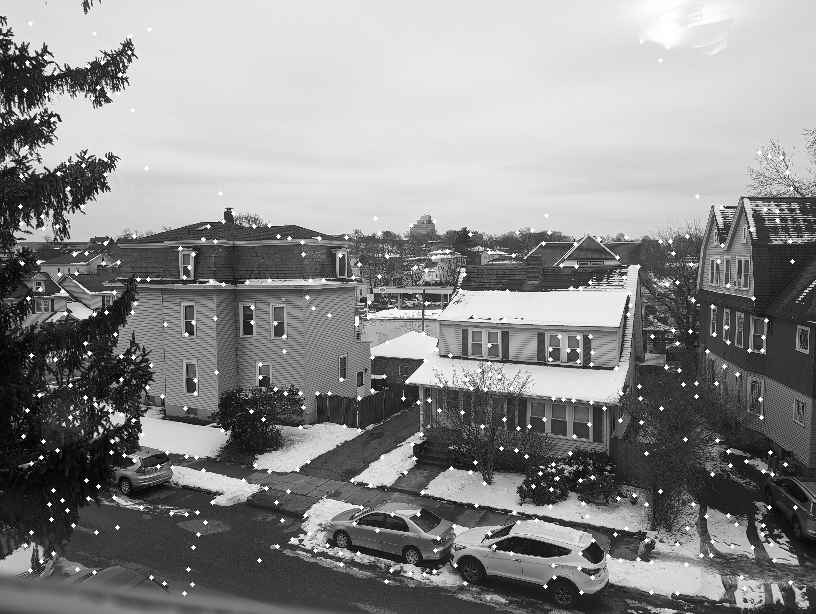

In [127]:
r = 1
# plt.figure (figsize= (40,40))
print(gray.shape)
good1 = []
idx = 0
gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)
gray.astype(np.float32)
for im in corners1:
  a,b,z = standard(gray,im)
  if z:
    good1.append((b,idx))
    cv.circle(gray, (int(im[0]), int(im[1])), 2, 255, -1)
    # plt.subplot(50,50,r)
    # r+=1
    # plt.imshow(a)
  idx+=1
cv2_imshow(gray)
# plt.show()

(614, 816)


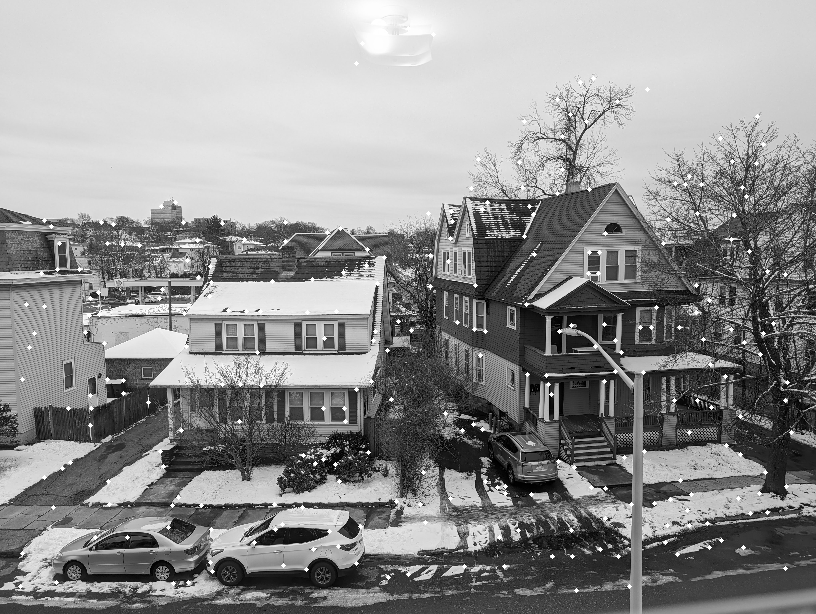

In [128]:
r = 1
# plt.figure (figsize= (40,40))
print(gray2.shape)
good2 = []
idx=0
gray2 = cv.cvtColor(img2,cv.COLOR_BGR2GRAY)
gray2.astype(np.float32)
for im in corners2:
  a,b,z = standard(gray2,im)
  if z:
    good2.append((b,idx))
    cv.circle(gray2, (int(im[0]), int(im[1])), 2, 255, -1)
    # plt.subplot(50,50,r)
    # r+=1
    # plt.imshow(a)
  idx+=1
cv2_imshow(gray2)
# plt.show()

(807, 605)


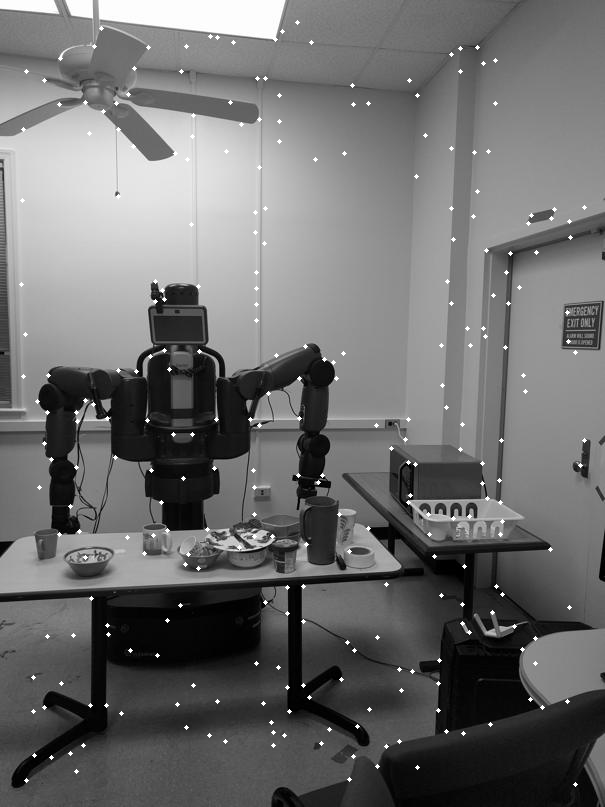

In [13]:
r = 1
# plt.figure (figsize= (40,40))
print(gray3.shape)
good3 = []
idx=0
gray3 = cv.cvtColor(img3,cv.COLOR_BGR2GRAY)
gray3.astype(np.float32)
for im in corners3:
  a,b,z = standard(gray3,im)
  if z:
    good3.append((b,idx))
    cv.circle(gray3, (int(im[0]), int(im[1])), 2, 255, -1)
    # plt.subplot(50,50,r)
    # r+=1
    # plt.imshow(a)
  idx+=1
cv2_imshow(gray3)
# plt.show()

In [129]:
def pre_match(corners1,corners2,gray,gray2,matches,countb):
  key1 = []
  key2 = []
  for (a,b) in matches:
    if countb[b]<2:
      key1.append([corners1[a][0],corners1[a][1]])
      key2.append([corners2[b][0],corners2[b][1]])
  key1a = np.array(key1,dtype=float)
  key2a = np.array(key2,dtype=float)
  cv_kpts1 = [cv.KeyPoint(key1a[i][0], key1a[i][1], 1) for i in range(key1a.shape[0])]
  cv_kpts2 = [cv.KeyPoint(key2a[i][0], key2a[i][1], 1) for i in range(key2a.shape[0])]
  drawout = np.array([])
  good_matches = [cv.DMatch(_imgIdx=0, _queryIdx=idx, _trainIdx=idx,_distance=0) for idx in range(np.shape(key1a)[0])]
  drawout = cv.drawMatches(np.uint8(gray),cv_kpts1,np.uint8(gray2),cv_kpts2,good_matches,outImg=drawout)
  cv2_imshow(drawout)
  return key1a, key2a

In [132]:
def find_match(good1,good2,corners1,corners2,gray,gray2):
  matches = []
  countb = np.zeros(2000)
  for i in range(len(good1)):
    vec1 = good1[i][0]
    c1 = good1[i][1]
    lowest = None
    secondlowest = None
    idx = None
    for j in range(len(good2)):
      vec2 = good2[j][0]
      c2 = good2[j][1]
      diff = np.sum((vec1-vec2)**2)
      if(lowest is None or diff<lowest):
        secondlowest = lowest
        lowest = diff
        idx = c2
      elif(secondlowest is None or diff<secondlowest):
        secondlowest = diff
    if(lowest/secondlowest<0.6):
      matches.append((c1,idx))
      countb[idx]+=1
    matches = list(set(matches))
  print(len(matches))
  return pre_match(corners1,corners2,gray,gray2,matches,countb)

31


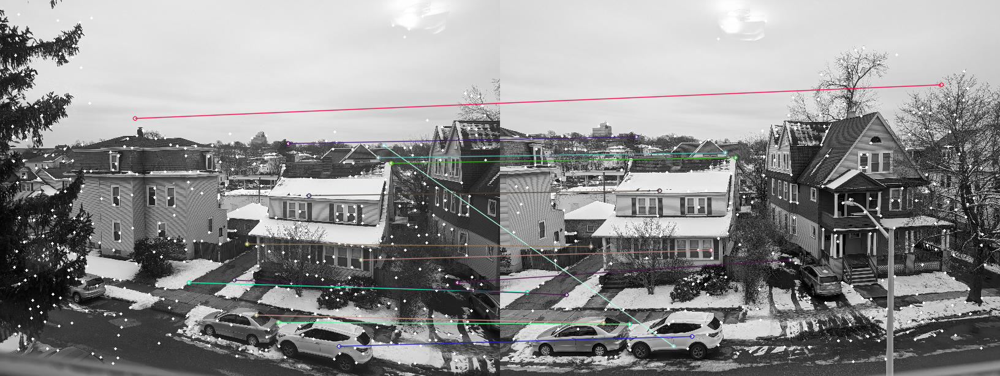

In [133]:
key2a , key3a = find_match(good1,good2,corners1,corners2,gray,gray2)

In [134]:
def checkpairs(rand_list,point1,point2):
    dst = np.zeros((4,2),dtype=np.float32)
    src = np.zeros((4,2),dtype=np.float32)
    for i in range(4):
        dst[i,:] = point1[rand_list[i]][:]
        src[i,:] = point2[rand_list[i]][:]
    trasform_mat = cv.getPerspectiveTransform(src,dst)
    det = np.linalg.det(trasform_mat)
    if(det==0):
      return 1e14, trasform_mat
    sdd = 0
    src_cd = np.ones((3,1),dtype=np.float32)
    # inverse = np.linalg.inv(trasform_mat)
    for i in range(point2.shape[0]):
        src_cd[0,0]=point2[i][0]
        src_cd[1,0]=point2[i][1]
        new_cd = np.matmul(trasform_mat,src_cd)
        sdd += np.sum((new_cd[0:2].T-point1[i][:])**4)
    # print(sdd)
    return sdd,trasform_mat

In [135]:
def RANSAC(key1a,key2a,gray,gray2):#(matched_pairs, outliers, accuracy, thresh):
    best_transform = []
    best_sdd = 1e14
    iterations = 5000
    count =  np.zeros(key1a.shape[0])
    for aa in range(iterations):
        if(key1a.shape[0]<8):
          break
        #randomly select four points
        n_rows = key1a.shape[0]
        random_indices = np.random.randint(n_rows, size=4)
        chk,TM = checkpairs(random_indices,key1a,key2a)
        if chk<best_sdd:
          best_sdd = chk
          best_transform = TM
        # print(chk)
        if chk> 1e13/(aa+1):
          mna = np.zeros(key1a[0].shape)
          mnb = np.zeros(key1a[0].shape)
          for i in random_indices:
            count[i]+=1
            mna += key1a[i]*0.25
            mnb += key2a[i]*0.25
          mx = 0
          idx = 0
          for i in range(4):
            j = random_indices[i]
            val = np.sum((key1a[j]-mna)**2)
            val += np.sum((key2a[j]-mnb)**2)
            if val>mx:
              mx = val
              idx = j
          # for i in random_indices:
          # i = random_indices
          nw1 = np.delete(key1a,idx,0)
          nw2 = np.delete(key2a,idx,0)
          nw3 = np.delete(count,idx)
          key1a = nw1
          key2a = nw2
          count = nw3

    # return [],best_transform
    r = np.argsort(count)
    rev = np.flip(r)
    key1 = []
    key2 = []
    for i in r:
      key1.append(key1a[i][:])
      key2.append(key2a[i][:])
    key1b = np.array(key1,dtype=float)
    key2b = np.array(key2,dtype=float)
    cv_kpts1 = [cv.KeyPoint(key1b[i][0], key1b[i][1], 1) for i in range(key1b.shape[0])]
    cv_kpts2 = [cv.KeyPoint(key2b[i][0], key2b[i][1], 1) for i in range(key2b.shape[0])]

    drawout = np.array([])
    good_matches = [cv.DMatch(_imgIdx=0, _queryIdx=idx, _trainIdx=idx,_distance=0) for idx in range(np.shape(key1b)[0])]
    drawout = cv.drawMatches(np.uint8(gray),cv_kpts1,np.uint8(gray2),cv_kpts2,good_matches,outImg=drawout)
    # print(drawout)
    cv2_imshow(drawout)
    ord = np.argsort(count)
    ord = np.flip(ord)
    key1c = []
    for j in range(min(4,count.shape[0])):
      i = ord[j]
      key1c.append([key1b[i],key2b[i]])
    return np.unique(key1c,axis=0), best_transform

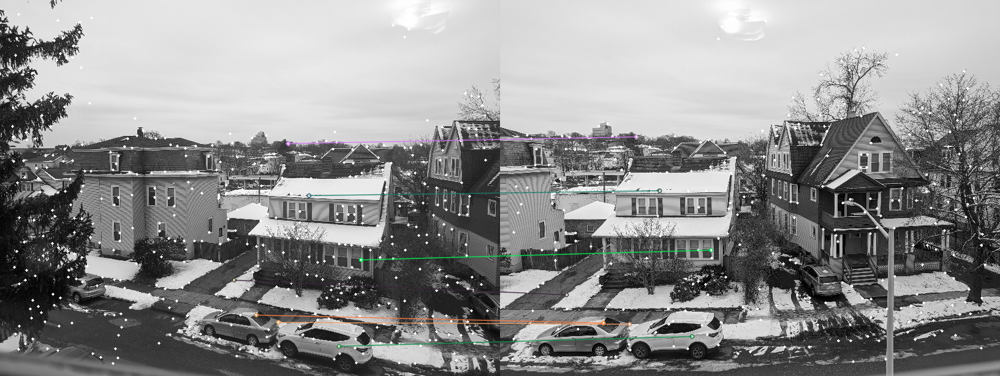

In [138]:
a,trasform_mat=RANSAC(key2a,key3a,gray,gray2)
# print(np.unique(a,axis=0))
# print(a)
# print(trasform_mat)

In [25]:
# def blendimg(img1,img2,transform_mat,a):
#   inverse = np.linalg.inv(transform_mat)
#   xs = img2.shape[0]
#   ys = img2.shape[1]
#   tmat = np.array([[0,0,1]]).T#,[xs,0,1],[0,ys,1]]).T
#   out = np.matmul(inverse,tmat)
#   # print(out)
#   xl = int(max(np.max(out[0,:]),0))
#   yl = int(max(np.max(out[1,:]),0))
#   print(xl,yl)
#   tmat = np.array([0,0,1]).T
#   tmat[0] = xs+xl
#   tmat[1] = ys+xl
#   out = np.matmul(transform_mat,tmat)
#   w = img1.shape[0] # int(max(out[0],img1.shape[0]))
#   h = img1.shape[1] # int(max(out[1],img1.shape[1]))
#   ws = max(xl+xs,w)
#   hs = max(yl+ys,h)
#   tmp2 = np.zeros((ws,hs,3))
#   b1 = np.zeros((ws,hs,3))
#   # print(xl,xl+xs)
#   # print(yl,yl+ys)
#   tmp2[xl:xl+xs,yl:yl+ys,:] = img2
#   b1[xl:xl+xs,yl:yl+ys,:] = img1
#   ##################################################
#   # from skimage import transform
#   dst = np.zeros((4,2),dtype=np.float32)
#   src = np.zeros((4,2),dtype=np.float32)
#   random_indices = np.random.randint(src.shape[0], size=4)
#   for i in range(4):
#     j = random_indices[i]
#     dst[i,:] = a[j,0,:] + [xl,yl]
#     src[i,:] = a[j,1,:] + [xl,yl]
#   trasform_mat = cv.getPerspectiveTransform(src,dst)
#   while(np.sum(trasform_mat[:,:])-trasform_mat[2,2]==0):
#     random_indices = np.random.randint(src.shape[0], size=4)
#     for i in range(4):
#       j = random_indices[i]
#       dst[i,:] = a[j,0,:]
#       src[i,:] = a[j,1,:]
#     trasform_mat = cv.getPerspectiveTransform(src,dst)
#   # print(b1.shape)
#   # cv2_imshow(tmp2)
# ####################################################
#   b2 = cv.warpPerspective(tmp2,transform_mat,(hs,ws))
#   return b1,b2

In [26]:
# # from skimage import transform
# dst = np.zeros((4,2),dtype=np.float32)
# src = np.zeros((4,2),dtype=np.float32)
# random_indices = np.random.randint(src.shape[0], size=4)
# for i in range(4):
#   j = i#random_indices[i]
#   dst[i,:] = a[j,0,:] 
#   src[i,:] = a[j,1,:] 
# trasform_mat = cv.getPerspectiveTransform(src,dst)
# while(np.sum(trasform_mat[:,:])-trasform_mat[2,2]==0):
#   random_indices = np.random.randint(src.shape[0], size=4)
#   for i in range(4):
#     j = random_indices[i]
#     dst[i,:] = a[j,0,:]
#     src[i,:] = a[j,1,:]
#   trasform_mat = cv.getPerspectiveTransform(src,dst)

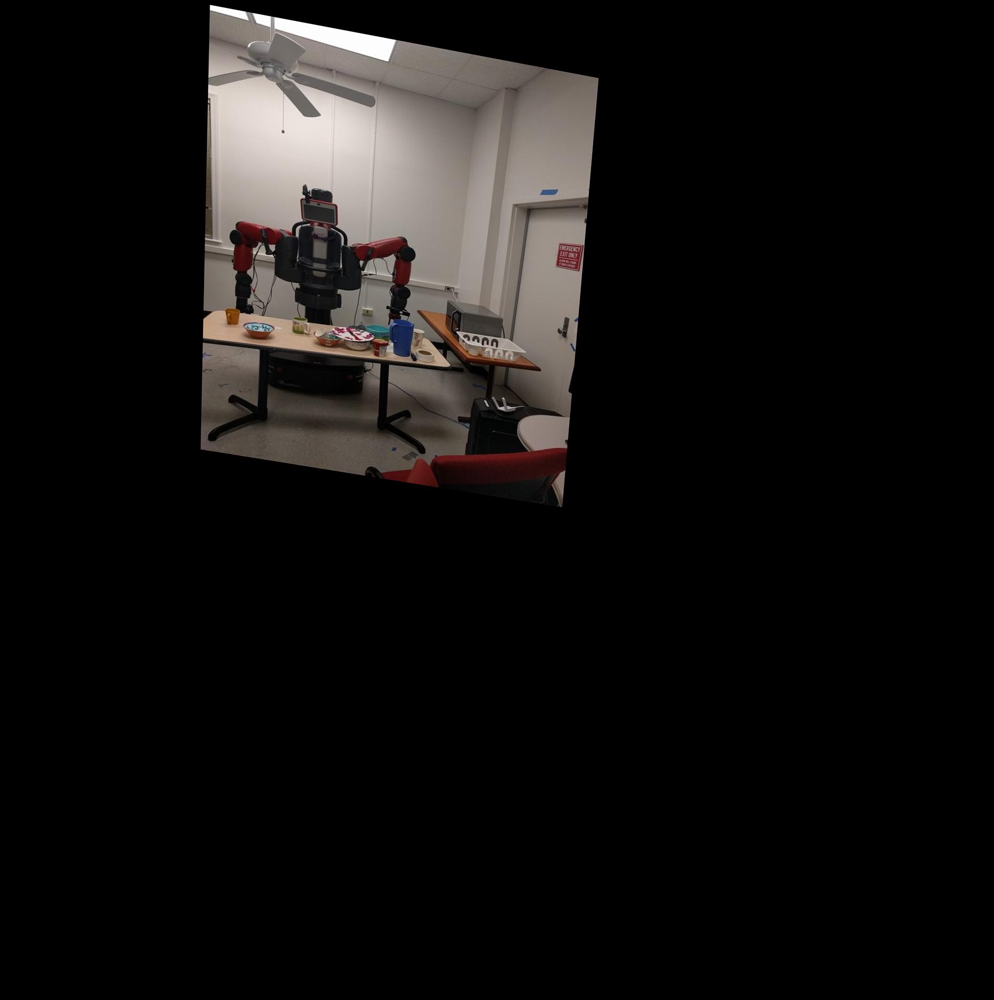

In [80]:
img3.astype(float)
img3b = img3#cv.copyMakeBorder(img2,20,20,20,20,0)
Ib = cv.warpPerspective(img3b,trasform_mat,(gray.shape[0]*2,gray.shape[1]*2),flags=cv.INTER_CUBIC)
# newIb = cv.copyMakeBorder(Ib,5,5,5,5,0)
# newIb = newIb.astype(dtype=int)
b3 = Ib
cv2_imshow(b3)

In [143]:
def stitch_img(image1 ,image2, h_best):

    height_1, width_1,_= np.shape(image1)
    height_2,width_2,_ = np.shape(image2)
    msk = np.ones((height_1, width_1,3),dtype = np.uint8)
    pt1 = np.array([[0, width_1, width_1, 0,width_1/2], [0, 0, height_1, height_1,height_1/2], [1, 1, 1, 1, 1]])
    p_dash = np.dot(h_best, pt1)

    p_dashxy = p_dash / p_dash[2]
    xrow = p_dashxy[0]
    yrow = p_dashxy[1]
    ymin = int(min(yrow))
    xmin = int(min(xrow))
    ymax = int(max(yrow))
    xmax = int(max(xrow))
    center = (p_dashxy[0,4],p_dashxy[1,4])
    
    newh = np.array([[1, 0, -1 * xmin], [0, 1, -1 * ymin], [0, 0, 1]])    # Make new matrix that removes offset and multiply by homography
    xstart = 0
    ystart = 0
    size = (xmax-xmin,ymax-ymin)#(int(max(xmax,width_2-xmin)-xstart),int(max(ymax,height_2-ymin)-ystart))
    # print(xmin,ymin)
    # print(xmax,ymax)
    if xmin>0:
      xstart = int(xmin)
      xmin = 0
    if ymin>0:
      ystart = int(ymin)
      ymin = 0
    
    warped_image = cv.warpPerspective(image1, newh.dot(h_best), dsize=size)    #Warpigng
    mask = cv.warpPerspective(msk, newh.dot(h_best), dsize=size)    #Warpigng
    wx,wy,_ = warped_image.shape
    # print(warped_image.shape)
    # cv2_imshow(warped_image)
    
    new_warped = np.zeros((ystart + wx,xstart + wy,3))
    new_mask = np.zeros((ystart + wx,xstart + wy,3),dtype = np.uint8)
    # print(xstart,ystart)
    # print(new_warped.shape)
    # print(wx,wy)
    new_warped = new_warped.astype(np.uint8)
    new_warped[ystart:ystart + wx,xstart:xstart + wy,:] = warped_image
    new_mask[ystart:ystart + wx,xstart:xstart + wy,:] = mask
    # cv2_imshow(new_warped)
    black2 = np.zeros((new_warped.shape))
    # print(xmin,ymin)
    # print(black2.shape)
    # print(image2.shape)
    # print(width_2,height_2)
    black2[abs(ymin):height_2+abs(ymin),abs(xmin):abs(xmin)+width_2] = image2
    return new_warped, black2, warped_image, mask, center,new_mask

In [144]:
b2,b3,wrp,mask,center,m1 = stitch_img(img2,img,trasform_mat)
print(center)
# cv2_imshow(wrp)
# cv2_imshow(mask)

(664.8026118688738, 321.4689224068888)


In [145]:
def weight(b2,b3):
  newIb = b3
  final = np.zeros(b3.shape)
  gray_expand = np.zeros(b3.shape,b3.dtype)
  imgb = b2
  gray_expand[0:imgb.shape[0],0:imgb.shape[1],:] = imgb
  
  final = 0.5*gray_expand + 0.5*newIb
  for i in range(newIb.shape[0]):
    for j in range(newIb.shape[1]):
      if np.sum(newIb[i,j,:])<10:
        final[i,j,:] = gray_expand[i,j,:]
      if np.sum(gray_expand[i,j,:])==0:
        final[i,j,:] = newIb[i,j,:]
  oa = final.astype(np.uint8)
  cv2_imshow(oa)
  return oa

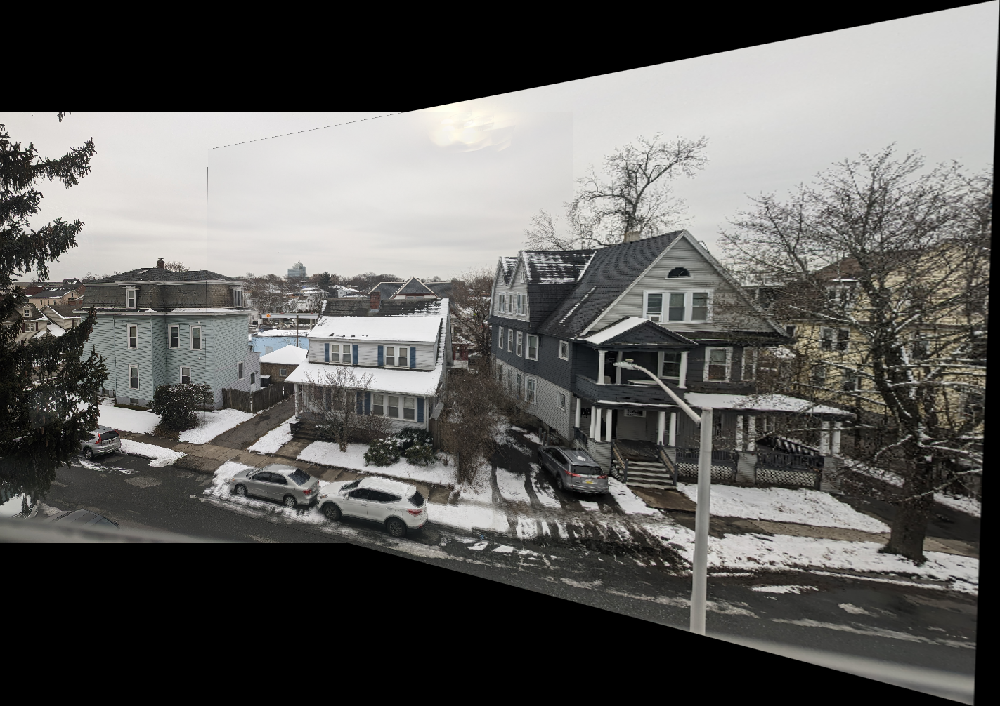

In [146]:
oa = weight(b2,b3)

In [33]:
# def get_centre(mask,image_small):
#   gray = cv.cvtColor(mask, cv.COLOR_BGR2GRAY)
#   ret, thresh = cv.threshold(gray, 100, 255,cv.THRESH_BINARY_INV)
#   contours, hierarchies = cv.findContours(thresh, cv.RETR_LIST, cv.CHAIN_APPROX_SIMPLE)
#   # print(contours)

#   blank = np.zeros(thresh.shape[:2],dtype='uint8')
 
#   cv.drawContours(blank, contours, -1,(255, 0, 0), 1)
  
#   cv2_imshow(blank)

#   cx = mask.shape[0]//2
#   cy = mask.shape[1]//2
#   for i in contours:
#     M = cv.moments(i)
#     if M['m00'] != 0:
#         cx = int(M['m10']/M['m00'])
#         cy = int(M['m01']/M['m00'])
#         print(cx,cy)
#         x,y,w,h = cv.boundingRect(i)
#         print(w,h)
#         print(mask.shape)
#         if h<0.95*mask.shape[0] or w<0.95*mask.shape[1]:
#           letter = image_small[y:y+h,x:x+w]
#           lm = mask[y:y+h,x:x+w,:]
#           cv2_imshow(letter)
#         # return cx,cy, letter,lm
#   return cx,cy, letter,lm

In [34]:
# newIb = b3
# final = np.zeros(newIb.shape)
# gray_expand = np.zeros(newIb.shape,newIb.dtype)
# imgb = b2
# gray_expand[0:imgb.shape[0],0:imgb.shape[1],:] = imgb

# print(gray_expand.shape)
# print(newIb.shape)
# xl = newIb.shape[0]
# yl = newIb.shape[1]
# src_mask = np.zeros(newIb.shape, newIb.dtype)
# im_mask = np.full(gray_expand.shape, (255,255,255), dtype = np.uint8)
# for i in range(xl):
#   for j in range(yl):
#     if(np.sum(newIb[i,j])==0) or i<=2 or j<=2 or i>xl-3 or j>yl-3:
#       im_mask[i,j,:]=0

# # cntr = np.array([img3b.shape[0]/2,img3b.shape[1]/2,1]).T

# # center = np.matmul(trasform_mat,cntr)[0:2]
# # center = center.astype(int)
# # print(center)
# cv2_imshow(im_mask)
# # # print(gray_expand.shape)
# # get_centre(im_mask)
# # center = (617,272)#get_centre(im_mask))#(gray_expand.shape[1]//2,gray_expand.shape[0]//2)



In [35]:
# xc,yc,letter,lm = get_centre(im_mask,newIb)

In [36]:
# bg = wrp
# fg = b3

# top, bottom, left, right = 20, 20, 20, 20
# border_bg = cv.copyMakeBorder(bg, top, bottom, left, right, cv.BORDER_CONSTANT, value=[0, 0, 0])
# border_fg = cv.copyMakeBorder(fg, top, bottom, left, right, cv.BORDER_CONSTANT, value=[0, 0, 0])
# border_mask = cv.copyMakeBorder(mask, top, bottom, left, right, cv.BORDER_CONSTANT, value=0)
# border_mask = border_mask.astype(np.uint8)

# print(border_mask.dtype)

# contours, _ = cv.findContours(border_mask.copy(), cv.RETR_LIST, cv.CHAIN_APPROX_SIMPLE)

# c = max(contours, key=cv.contourArea)
# x, y, w, h = cv.boundingRect(c)

# center = (int(x + w * 0.5), int(y + h * 0.5))

# print(center)
# center = (378,480)

# output = cv.seamlessClone(border_bg, border_fg, border_mask, p=center, flags=cv.NORMAL_CLONE)


In [147]:
from scipy.ndimage import laplace
def poisson_blend(target_img, src_img, mask_img, iter: int = 1024):
    target_img = target_img.astype(float)
    target_img = target_img/255
    src_img = src_img.astype(float)
    src_img = src_img/255
    for _ in range(iter):
        target_img = target_img + 0.1 * mask_img * laplace(target_img - src_img)
        # target_img = target_img.clip(0, 1)
    target_img = target_img.clip(0, 1)*255
    target_img = target_img.astype(np.uint8)
    return target_img

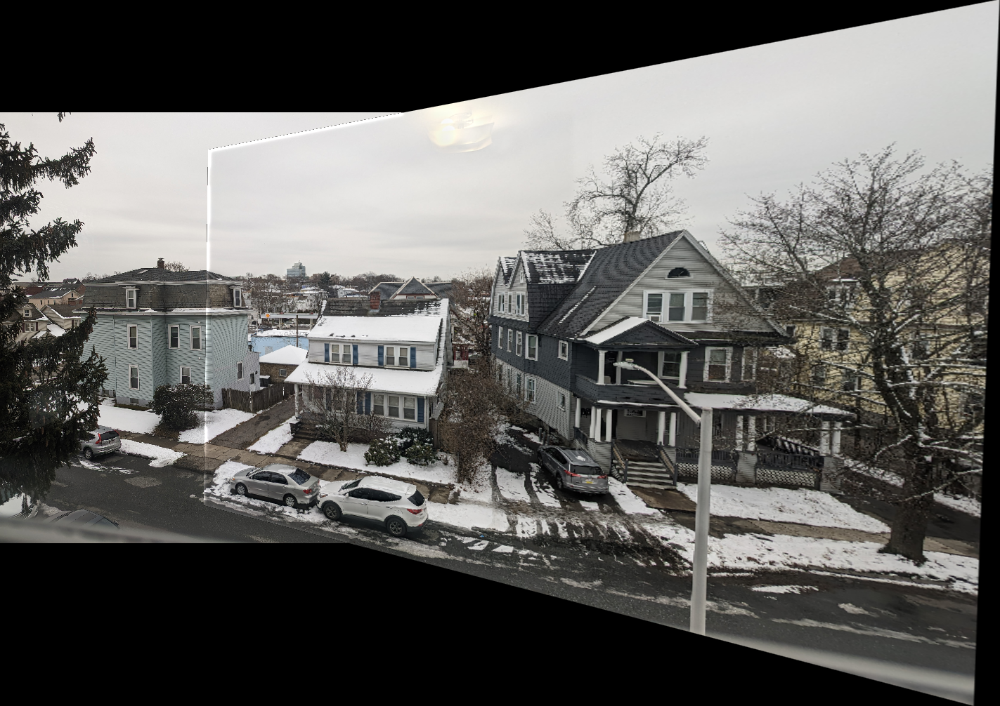

In [148]:
fin = poisson_blend(oa,b2,m1,50)
cv2_imshow(fin)

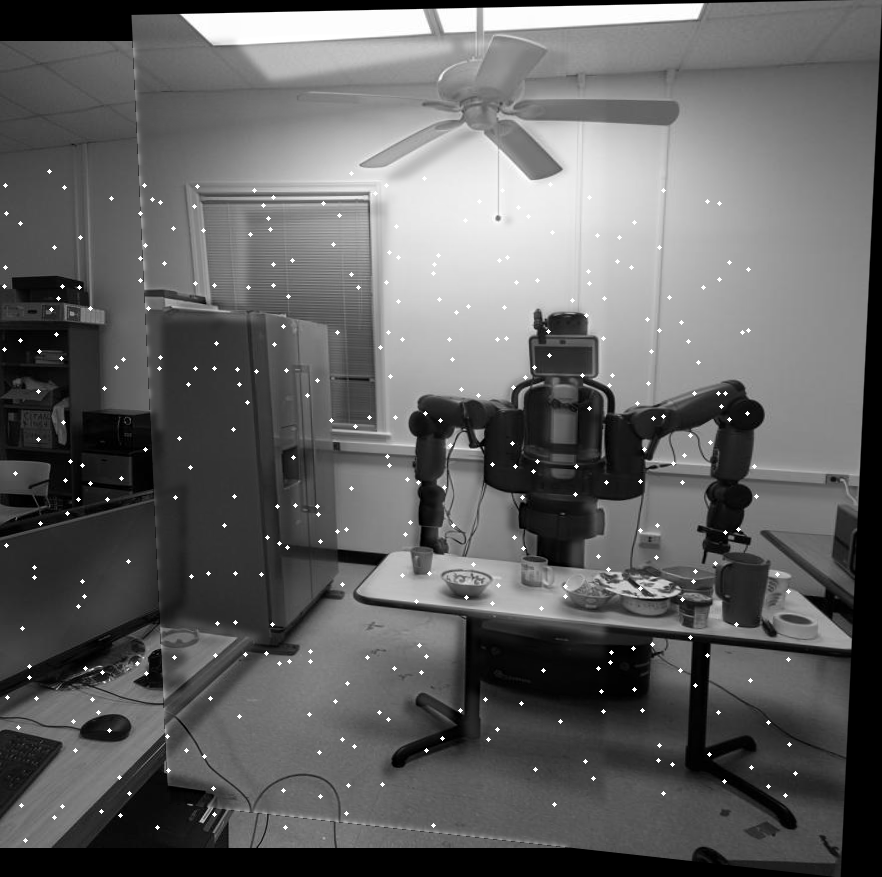

In [50]:
corners = np.ones((corners2.shape[0],3))
corners[:,0:2] = corners2
new_corners = np.dot(trasform_mat, corners.T)
new_corners = new_corners / new_corners[2]
new_corners = new_corners.T
gray = cv.cvtColor(fin,cv.COLOR_BGR2GRAY)
gray.astype(np.float32)
good1.append((b,idx))
for im in new_corners:
  cv.circle(gray, (int(im[0]), int(im[1])), 2, 255, -1)
cv2_imshow(gray)

In [239]:
# # oa = final.astype(np.uint8)
# center = (500,500)
# print(b3.shape)
# print(wrp.shape)
# print(mask.shape)
# print(b2.shape)
# mask = mask.astype(np.uint8)
# # print(border_fg.shape)
# main = np.zeros((1200,1200,3))
# main[20:895,20:885,:] = b2
# print(main.shape)
# # border_fg = cv.copyMakeBorder(center, top, bottom, left, right, cv.BORDER_CONSTANT, value=[0, 0, 0])

# # cv2_imshow(mask)
# # print(mask.shape)
# final = cv.seamlessClone(wrp,main, mask, center, cv.NORMAL_CLONE)
# # cv2_imshow(final)

In [161]:
# oa = final.astype(np.uint8)
center = (361,380)
final = cv.seamlessClone(letter,oa, lm, center, cv.NORMAL_CLONE)
cv2_imshow(final)

NameError: ignored